In [1]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

df_train = pd.read_csv("train.csv")
df_test  = pd.read_csv("test.csv")

print(df_train.shape, df_test.shape)
df_train.info()
df_train.describe()
df_train.isna().sum()


(11018, 36) (5000, 36)
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 11018 entries, 0 to 11017
Data columns (total 36 columns):
 #   Column                      Non-Null Count  Dtype  
---  ------                      --------------  -----  
 0   ApplicationDate             10488 non-null  object 
 1   Age                         10488 non-null  float64
 2   AnnualIncome                10488 non-null  float64
 3   CreditScore                 9987 non-null   float64
 4   LoanAmount                  9987 non-null   float64
 5   LoanDuration                10488 non-null  float64
 6   MaritalStatus               10488 non-null  object 
 7   NumberOfDependents          10488 non-null  float64
 8   HomeOwnershipStatus         10488 non-null  object 
 9   MonthlyDebtPayments         9987 non-null   float64
 10  CreditCardUtilizationRate   10488 non-null  float64
 11  NumberOfOpenCreditLines     10488 non-null  float64
 12  NumberOfCreditInquiries     10488 non-null  float64
 13  DebtToIn

ApplicationDate                530
Age                            530
AnnualIncome                   530
CreditScore                   1031
LoanAmount                    1031
LoanDuration                   530
MaritalStatus                  530
NumberOfDependents             530
HomeOwnershipStatus            530
MonthlyDebtPayments           1031
CreditCardUtilizationRate      530
NumberOfOpenCreditLines        530
NumberOfCreditInquiries        530
DebtToIncomeRatio              530
BankruptcyHistory             1031
LoanPurpose                   1031
PreviousLoanDefaults           530
PaymentHistory                 530
LengthOfCreditHistory          530
SavingsAccountBalance          530
CheckingAccountBalance        1031
TotalAssets                   1031
TotalLiabilities               530
MonthlyIncome                  530
UtilityBillsPaymentHistory     530
JobTenure                      530
EmploymentStatus               530
EducationLevel                 530
Experience          

### Уберем из данных шумы и null


In [2]:
def validate_dataframe(df, name="df", target="RiskScore"):
    import numpy as np
    import pandas as pd

    print(f"🔍 Проверка {name}:")

    # NaN
    nan_total = df.isna().sum()
    nan_total = nan_total[nan_total > 0]
    if not nan_total.empty:
        print("⚠️ Есть NaN в колонках:")
        print(nan_total)
    else:
        print("✅ Нет NaN")

    # inf
    if np.isinf(df.select_dtypes(include=[np.number])).any().any():
        print("⚠️ Есть ±inf значения в числовых признаках!")
    else:
        print("✅ Нет ±inf")

    # дубикаты
    dup_count = df.duplicated().sum()
    if dup_count > 0:
        print(f"⚠️ Дубликатов строк: {dup_count}")
    else:
        print("✅ Нет дубликатов строк")

    # Проверка целевой переменной
    if target in df.columns:
        y = df[target]
        if y.isna().any():
            print(f"⚠️ В {target} остались NaN")
        if not ((y >= 0) & (y <= 100)).all():
            print(f"⚠️ В {target} есть значения вне диапазона [0, 100]")
        else:
            print(f"✅ {target} в корректном диапазоне")

    print("-" * 40)


In [3]:
def clean_data(df_train, df_test, target="RiskScore"):
    import numpy as np

    cat_cols = df_train.select_dtypes(include="object").columns
    for col in cat_cols:
        df_train[col] = df_train[col].fillna("Unknown")
        df_test[col] = df_test[col].fillna("Unknown")

    num_cols = df_train.select_dtypes(include="number").columns.drop(target, errors="ignore")

    df_train = df_train.dropna(subset=num_cols)
    df_test = df_test.dropna(subset=num_cols)

    for col in num_cols:
        low, high = df_train[col].quantile([0.01, 0.99])
        df_train.loc[:, col] = df_train[col].clip(lower=low, upper=high)


    df_train = df_train[
        df_train[target].notna() &
        (df_train[target] >= 0) &
        (df_train[target] <= 100)
    ].reset_index(drop=True)

    df_train = df_train.drop_duplicates().reset_index(drop=True)


    return df_train, df_test



df_train, df_test = clean_data(df_train, df_test)

validate_dataframe(df_train, "train")
validate_dataframe(df_test, "test")


🔍 Проверка train:
✅ Нет NaN
✅ Нет ±inf
✅ Нет дубликатов строк
✅ RiskScore в корректном диапазоне
----------------------------------------
🔍 Проверка test:
✅ Нет NaN
✅ Нет ±inf
✅ Нет дубликатов строк
----------------------------------------


### Аналитика RiscScore

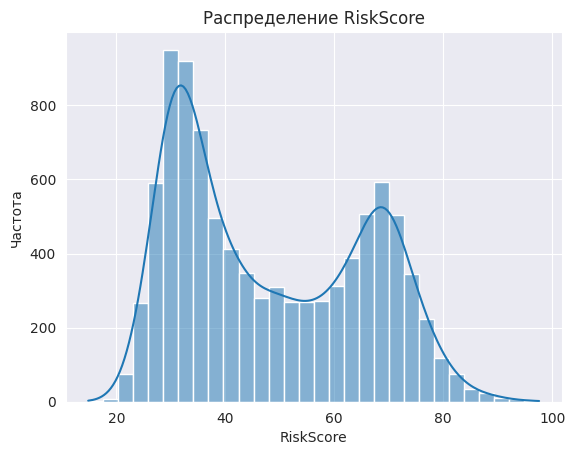

In [4]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.histplot(df_train["RiskScore"], bins=30, kde=True)
plt.title("Распределение RiskScore")
plt.xlabel("RiskScore")
plt.ylabel("Частота")
plt.show()


RiskScore                     1.000000
BaseInterestRate              0.762856
InterestRate                  0.748742
TotalDebtToIncomeRatio        0.632512
BankruptcyHistory             0.179697
MonthlyLoanPayment            0.164685
DebtToIncomeRatio             0.110034
LoanAmount                    0.078912
PreviousLoanDefaults          0.055248
CreditCardUtilizationRate     0.053129
LoanDuration                  0.025265
TotalLiabilities              0.023866
UtilityBillsPaymentHistory    0.020400
JobTenure                     0.015802
MonthlyDebtPayments           0.015683
PaymentHistory                0.014886
NumberOfDependents            0.008190
SavingsAccountBalance         0.001183
NumberOfOpenCreditLines      -0.001668
CheckingAccountBalance       -0.003451
NumberOfCreditInquiries      -0.015723
Age                          -0.041706
Experience                   -0.044335
LengthOfCreditHistory        -0.055507
TotalAssets                  -0.177903
NetWorth                 

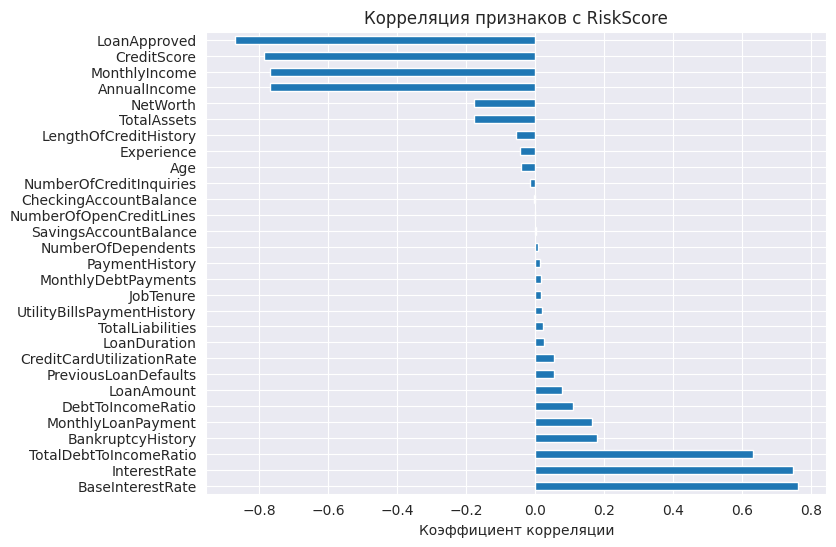

In [5]:
import numpy as np

correlations = df_train.corr(numeric_only=True)["RiskScore"].sort_values(ascending=False)
print(correlations)

plt.figure(figsize=(8, 6))
correlations.drop("RiskScore").plot(kind='barh')
plt.title("Корреляция признаков с RiskScore")
plt.xlabel("Коэффициент корреляции")
plt.grid(True)
plt.show()


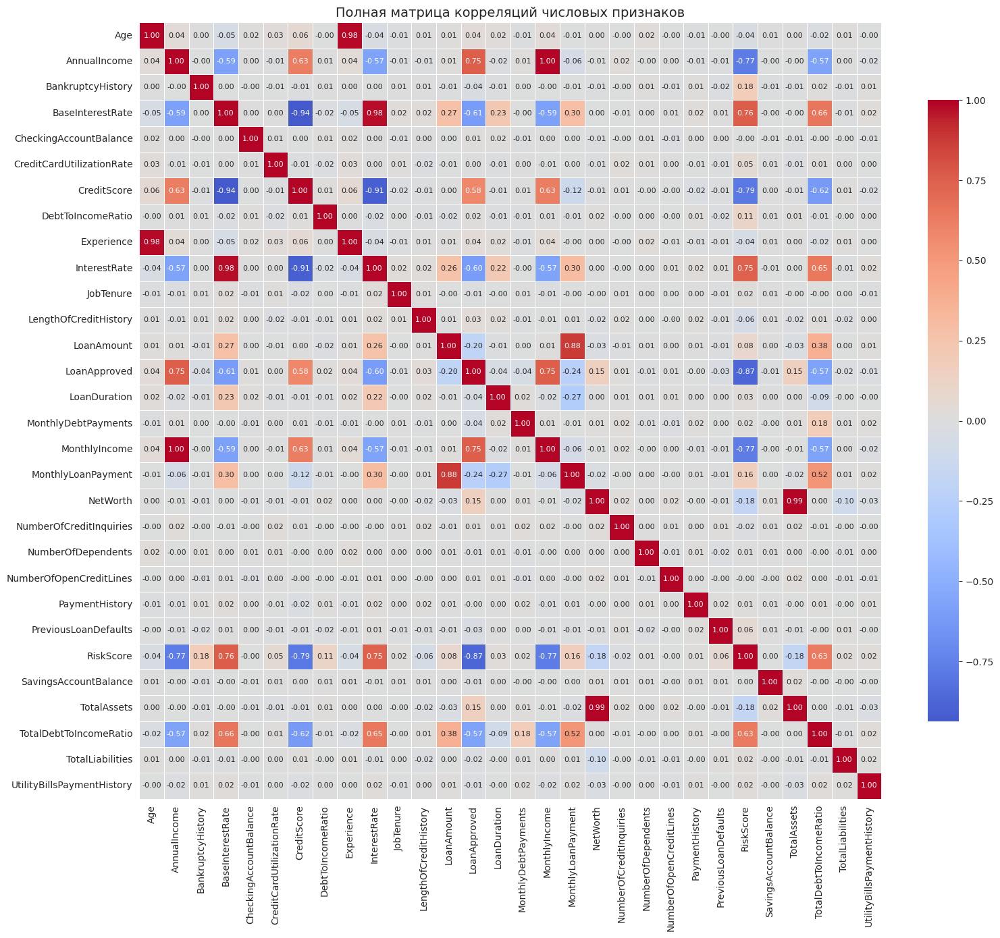

In [6]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

num_cols = df_train.select_dtypes(include="number").columns.drop("RiskScore")
corr = df_train[num_cols.union(["RiskScore"])].corr()

plt.figure(figsize=(16,14))
sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    cbar_kws={"shrink": .8},
    annot_kws={"size": 8}
)
plt.xticks(rotation=90, fontsize=10)
plt.yticks(rotation=0, fontsize=10)
plt.title("Полная матрица корреляций числовых признаков", fontsize=14)
plt.tight_layout()
plt.show()


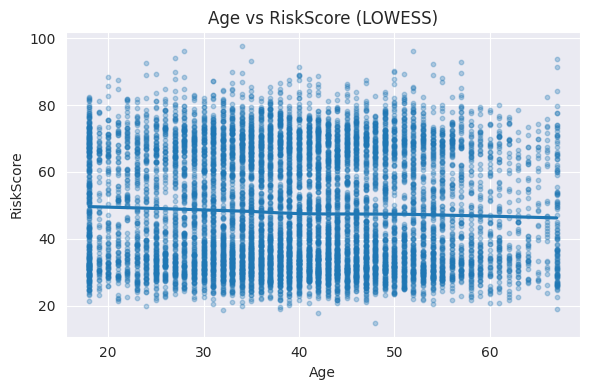

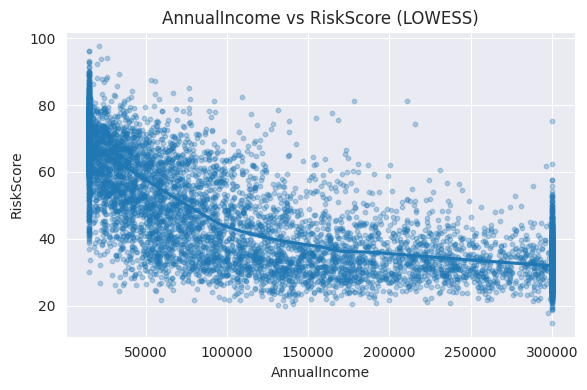

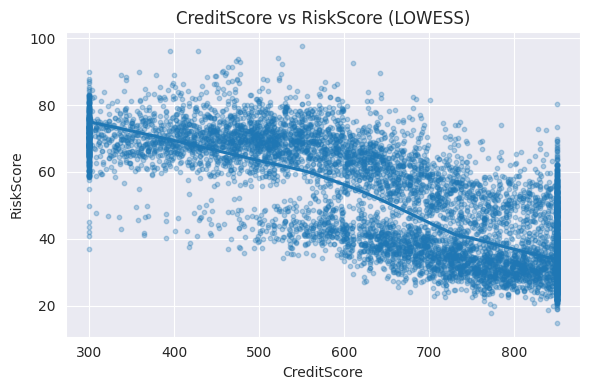

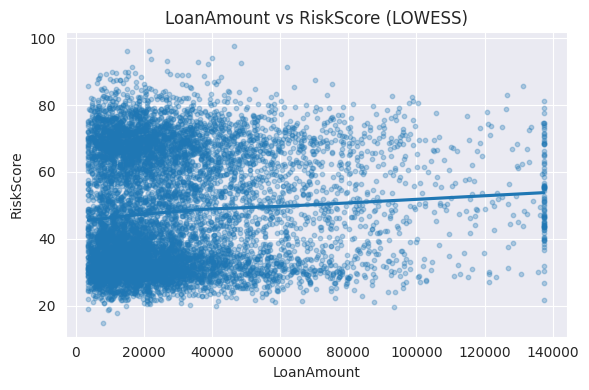

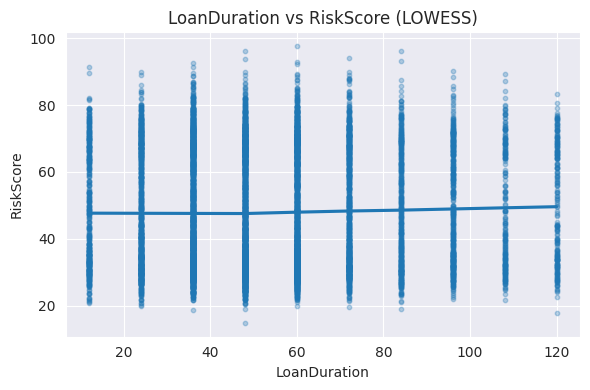

...

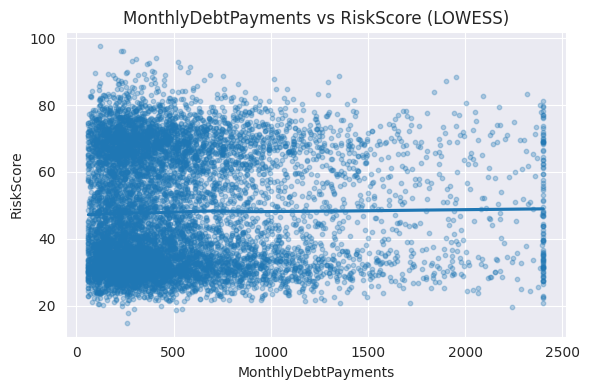

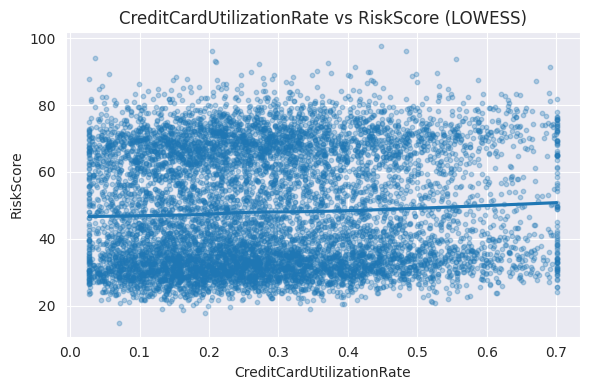

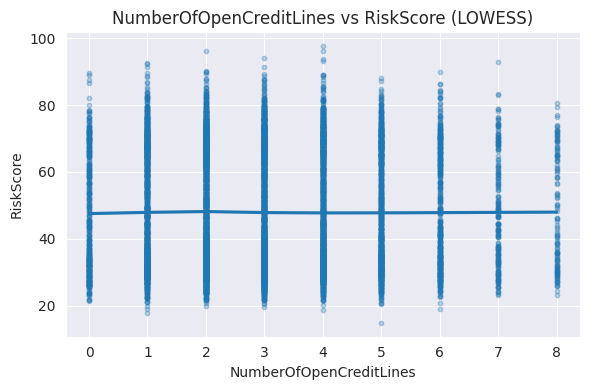

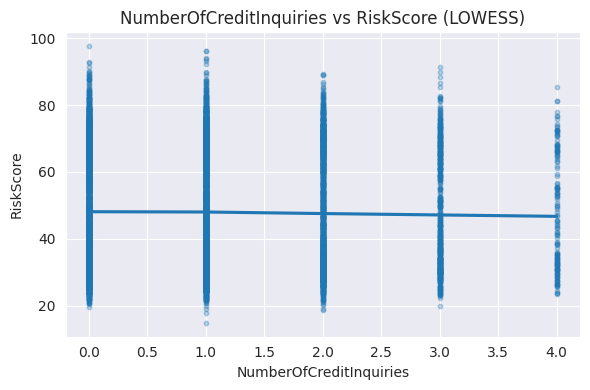

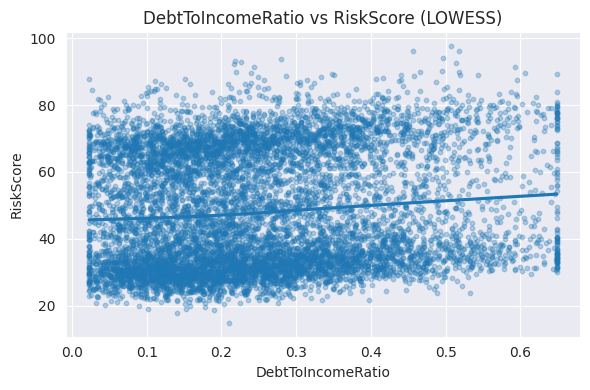

⏭Пропускаем BankruptcyHistory (уникальных значений: 2)
⏭Пропускаем PreviousLoanDefaults (уникальных значений: 2)


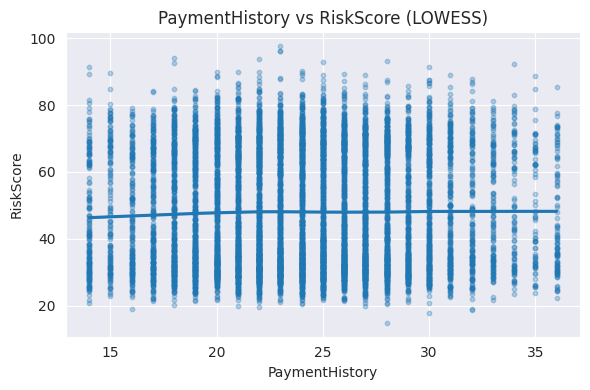

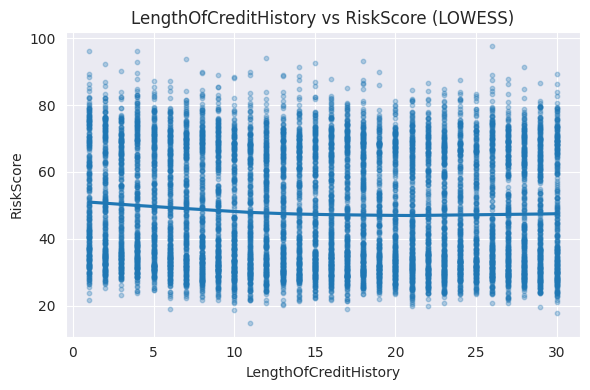

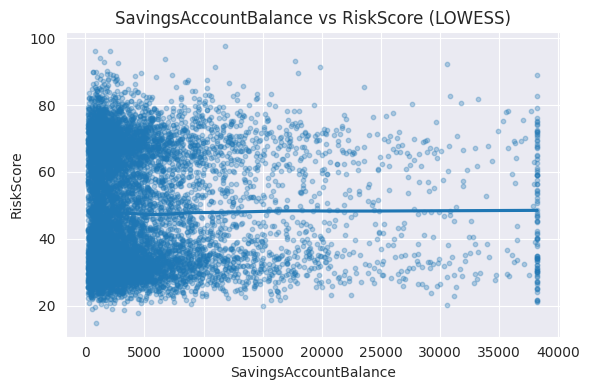

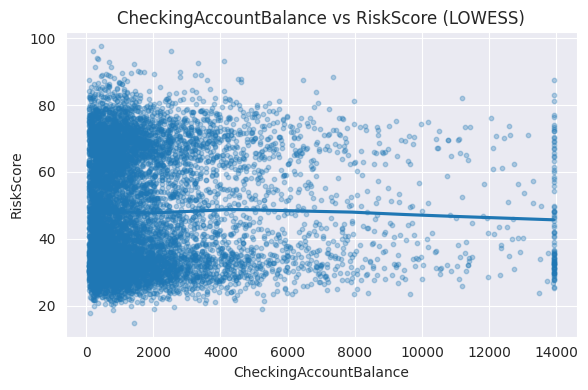

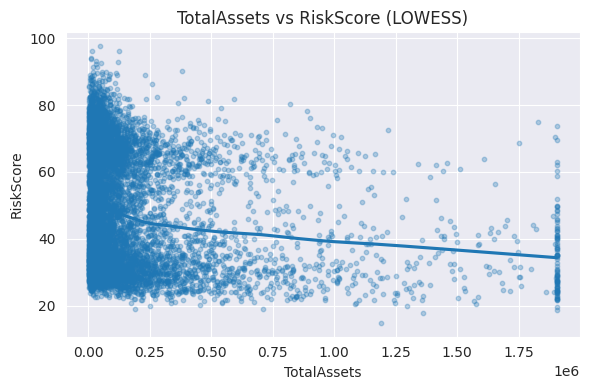

...

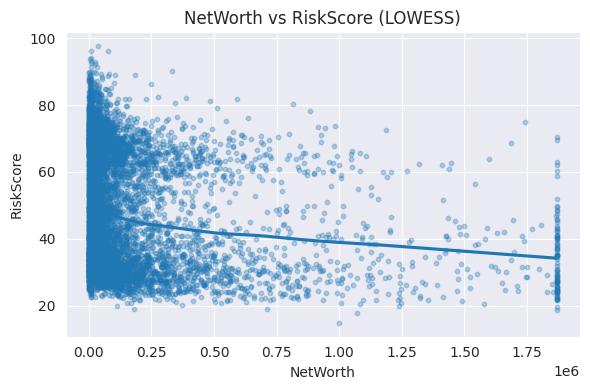

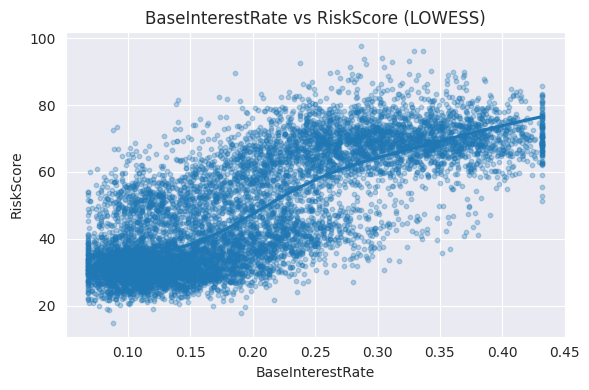

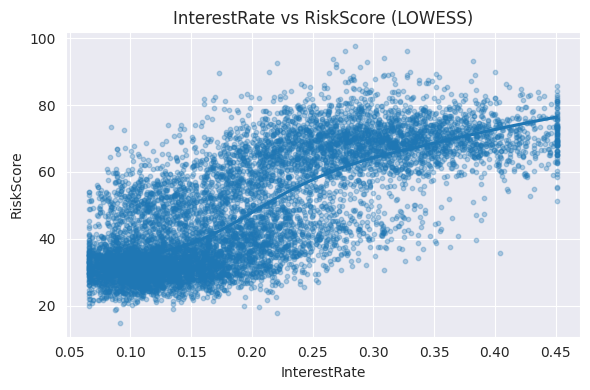

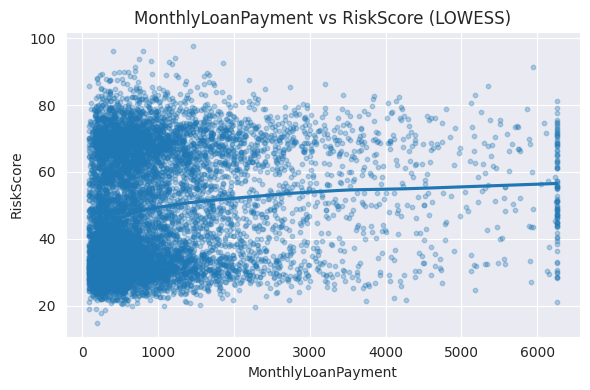

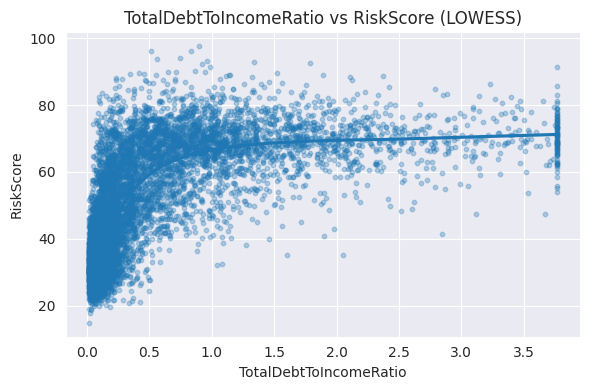

⏭Пропускаем LoanApproved (уникальных значений: 2)


In [7]:
import seaborn as sns
import matplotlib.pyplot as plt

num_cols = df_train.select_dtypes(include='number').columns.drop("RiskScore", errors="ignore")

for col in num_cols:
    tmp = df_train[[col, "RiskScore"]].dropna()
    if tmp[col].nunique() < 5:
        print(f"⏭Пропускаем {col} (уникальных значений: {tmp[col].nunique()})")
        continue
    if not np.isfinite(tmp[col]).all():
        print(f" Признак {col} содержит ±inf — пропущен")
        continue

    plt.figure(figsize=(6, 4))
    sns.regplot(x=col, y="RiskScore", data=tmp, lowess=True,
                scatter_kws={'s': 10, 'alpha': 0.3})
    plt.title(f"{col} vs RiskScore (LOWESS)")
    plt.tight_layout()
    plt.show()



### Преобразование данных в соответствии с данными

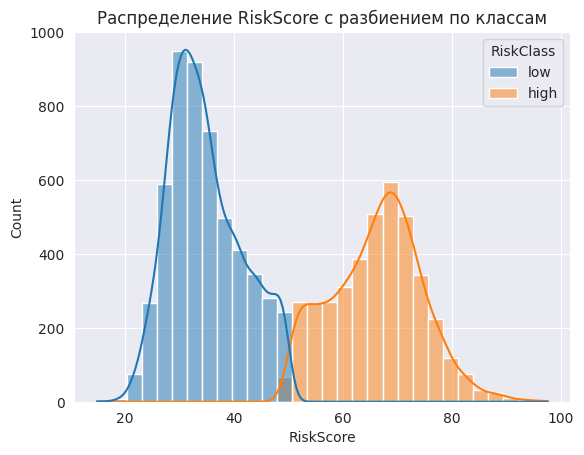

RiskClass
low     5320
high    4012
Name: count, dtype: int64


In [8]:
df_train["RiskClass"] = pd.cut(
    df_train["RiskScore"],
    bins=[0, 50, 100],
    labels=["low", "high"]
)

import seaborn as sns
import matplotlib.pyplot as plt

sns.histplot(data=df_train, x="RiskScore", hue="RiskClass", bins=30, kde=True)
plt.title("Распределение RiskScore с разбиением по классам")
plt.show()

print(df_train["RiskClass"].value_counts())


##### Сначал удалим повторяющиеся их матрицы корреляции

In [9]:
import numpy as np

num_cols = df_train.select_dtypes(include='number').columns.drop("RiskScore", errors="ignore")
corr_matrix = df_train[num_cols].corr().abs()

upper = corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(bool))

high_corr_pairs = [
    (col1, col2, corr_matrix.loc[col1, col2])
    for col1 in upper.columns
    for col2 in upper.index
    if pd.notna(upper.loc[col2, col1]) and upper.loc[col2, col1] > 0.9
]

high_corr_pairs = sorted(high_corr_pairs, key=lambda x: -x[2])
for a, b, c in high_corr_pairs:
    print(f"{a} vs {b} — corr = {c:.2f}")


MonthlyIncome vs AnnualIncome — corr = 1.00
NetWorth vs TotalAssets — corr = 0.99
Experience vs Age — corr = 0.98
InterestRate vs BaseInterestRate — corr = 0.98
BaseInterestRate vs CreditScore — corr = 0.94
InterestRate vs CreditScore — corr = 0.91


In [10]:
to_drop = ["Age", "InterestRate", "MonthlyIncome", "TotalAssets", "LoanAmount"]
df_train = df_train.drop(columns=to_drop)
df_test = df_test.drop(columns=to_drop)

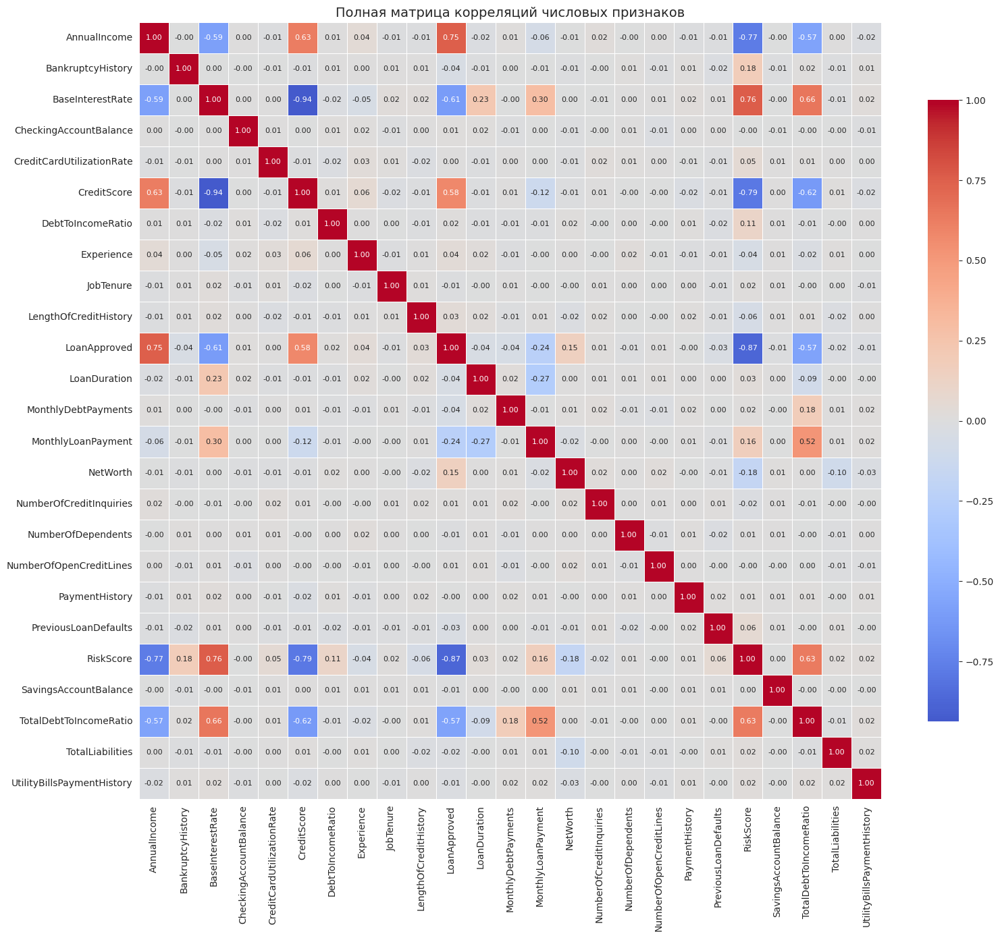

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

num_cols = df_train.select_dtypes(include="number").columns.drop("RiskScore")
corr = df_train[num_cols.union(["RiskScore"])].corr()

plt.figure(figsize=(16,14))
sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    cbar_kws={"shrink": .8},
    annot_kws={"size": 8}
)
plt.xticks(rotation=90, fontsize=10)
plt.yticks(rotation=0, fontsize=10)
plt.title("Полная матрица корреляций числовых признаков", fontsize=14)
plt.tight_layout()
plt.show()


##### Теперь обработаем Lowless

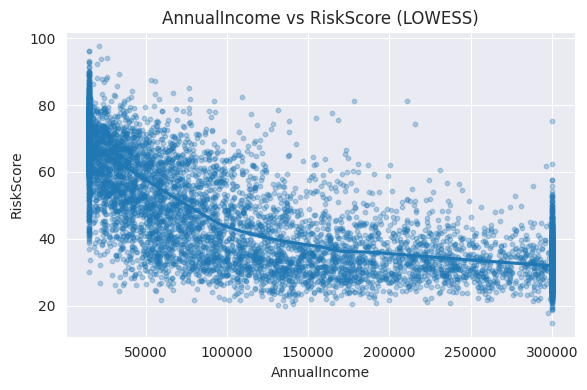

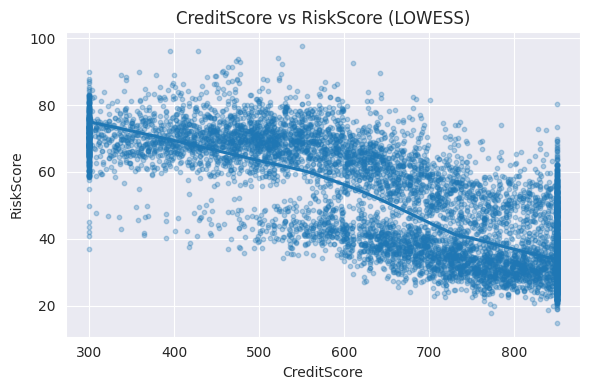

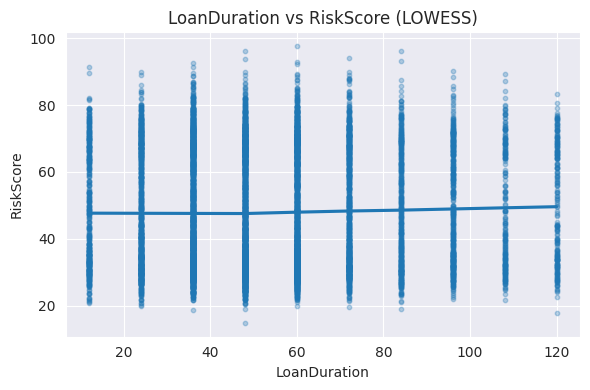

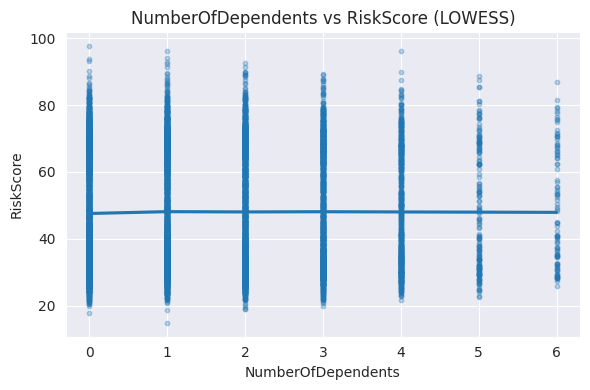

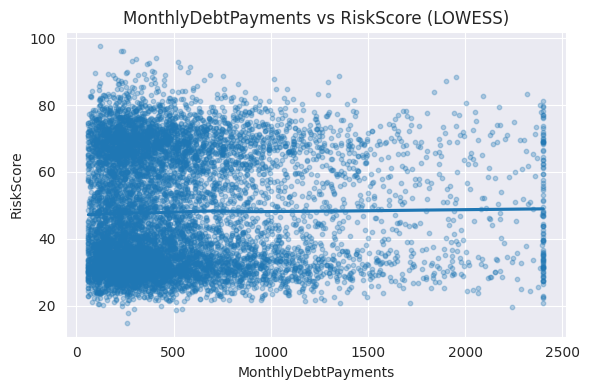

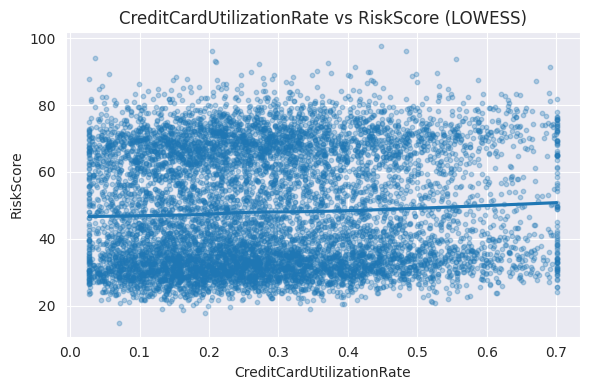

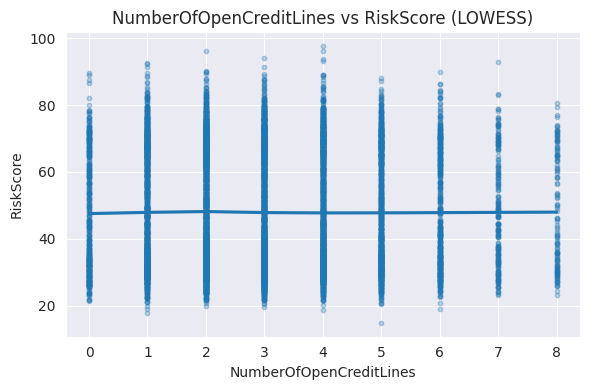

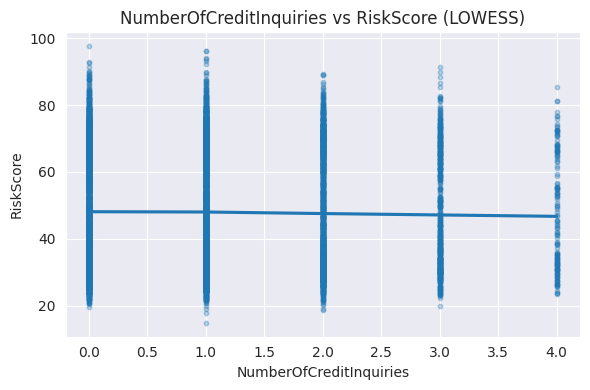

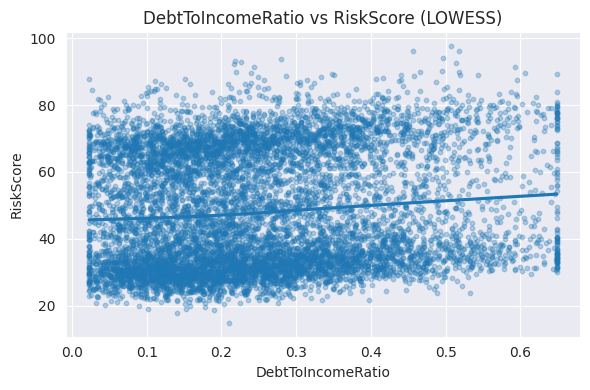

⏭Пропускаем BankruptcyHistory (уникальных значений: 2)
⏭Пропускаем PreviousLoanDefaults (уникальных значений: 2)


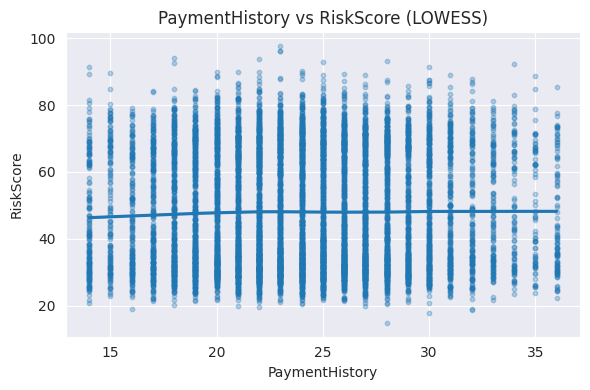

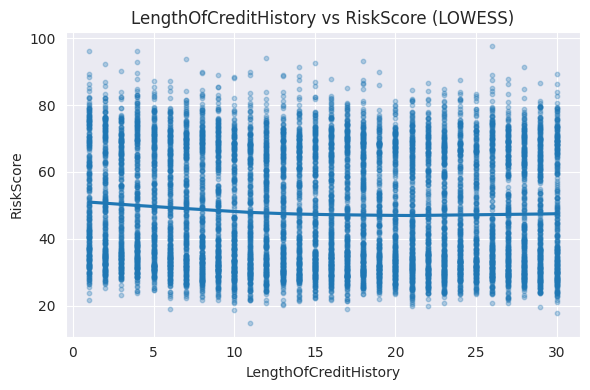

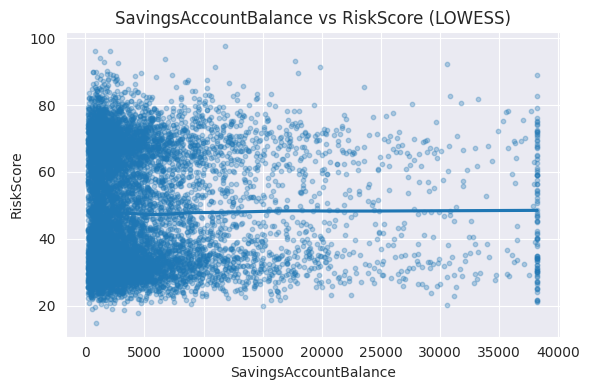

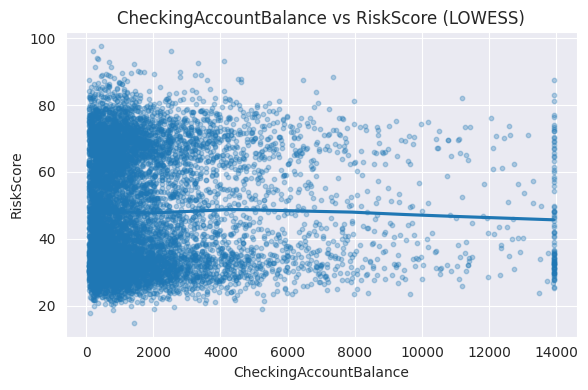

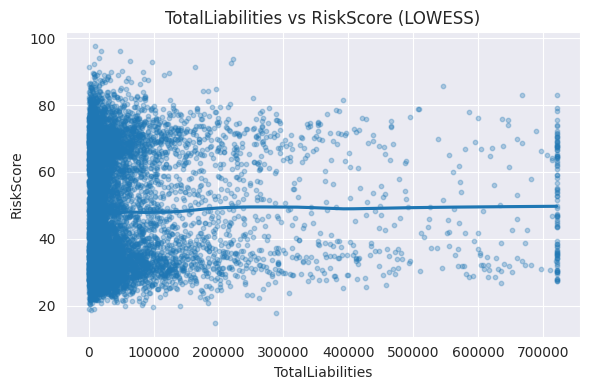

...

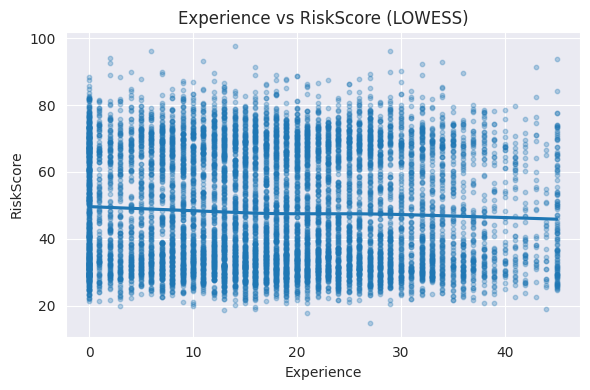

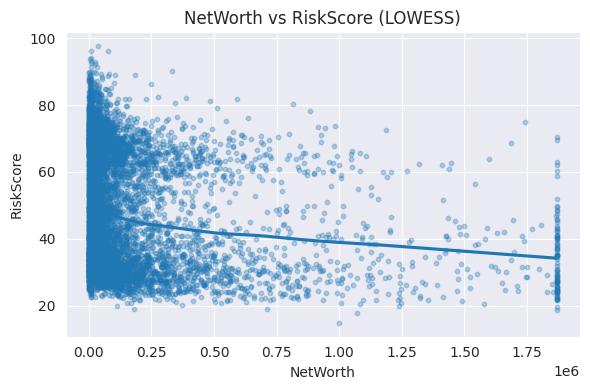

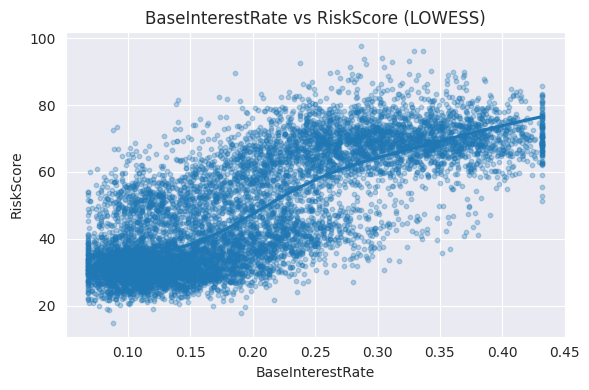

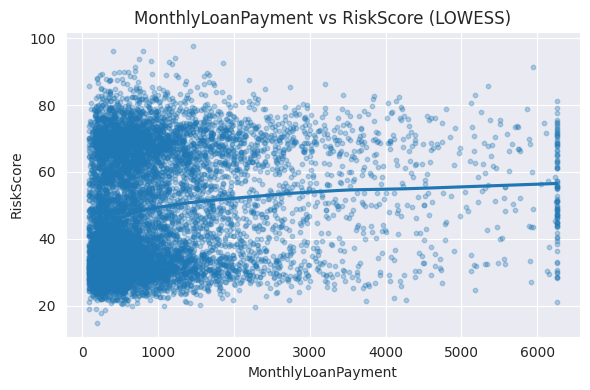

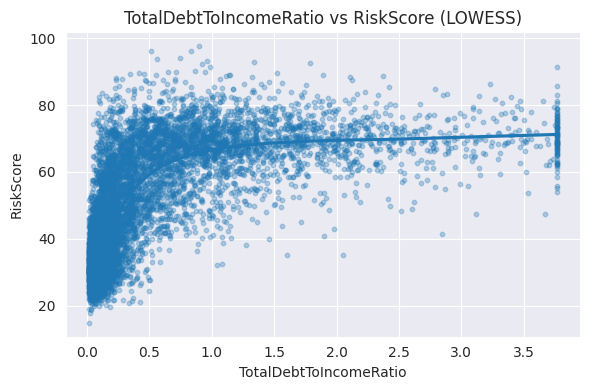

⏭Пропускаем LoanApproved (уникальных значений: 2)


In [12]:
import seaborn as sns
import matplotlib.pyplot as plt

num_cols = df_train.select_dtypes(include='number').columns.drop("RiskScore", errors="ignore")

for col in num_cols:
    tmp = df_train[[col, "RiskScore"]].dropna()
    if tmp[col].nunique() < 5:
        print(f"⏭Пропускаем {col} (уникальных значений: {tmp[col].nunique()})")
        continue
    if not np.isfinite(tmp[col]).all():
        print(f" Признак {col} содержит ±inf — пропущен")
        continue

    plt.figure(figsize=(6, 4))
    sns.regplot(x=col, y="RiskScore", data=tmp, lowess=True,
                scatter_kws={'s': 10, 'alpha': 0.3})
    plt.title(f"{col} vs RiskScore (LOWESS)")
    plt.tight_layout()
    plt.show()



##### Обработаные Lowless

In [13]:
import numpy as np

def apply_nonlinear_transforms(df):
    df = df.copy()

    if "AnnualIncome" in df.columns:
        df["LogAnnualIncome"] = np.log1p(df["AnnualIncome"])

    if "TotalDebtToIncomeRatio" in df.columns:
        df["LogDebtToIncome"] = np.log1p(df["TotalDebtToIncomeRatio"])

    if "CreditScore" in df.columns:
        df["CreditScore_squared"] = df["CreditScore"] ** 2

    if "BaseInterestRate" in df.columns:
        df["BaseInterestRate_cubed"] = df["BaseInterestRate"] ** 3

    return df

df_train = apply_nonlinear_transforms(df_train)
df_test = apply_nonlinear_transforms(df_test)


In [14]:
def drop_highly_correlated_originals(df, threshold=0.9):
    corr = df.select_dtypes(include='number').corr()

    candidate_pairs = [
        ("AnnualIncome", "LogAnnualIncome"),
        ("CreditScore", "CreditScore_squared"),
        ("BaseInterestRate", "BaseInterestRate_cubed"),
        ("TotalDebtToIncomeRatio", "LogDebtToIncome")
    ]

    to_drop = []

    for original, transformed in candidate_pairs:
        if original in df.columns and transformed in df.columns:
            value = abs(corr.loc[original, transformed])
            if value > threshold:
                to_drop.append(original)

    return to_drop
to_drop = drop_highly_correlated_originals(df_train)
print("Удаляем:", to_drop)

df_train = df_train.drop(columns=to_drop)
df_test = df_test.drop(columns=to_drop)


Удаляем: ['AnnualIncome', 'CreditScore', 'BaseInterestRate', 'TotalDebtToIncomeRatio']


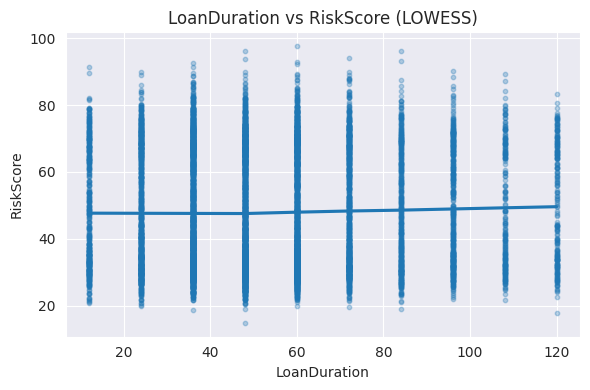

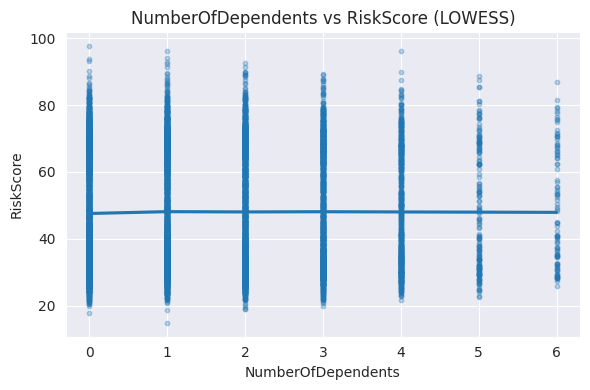

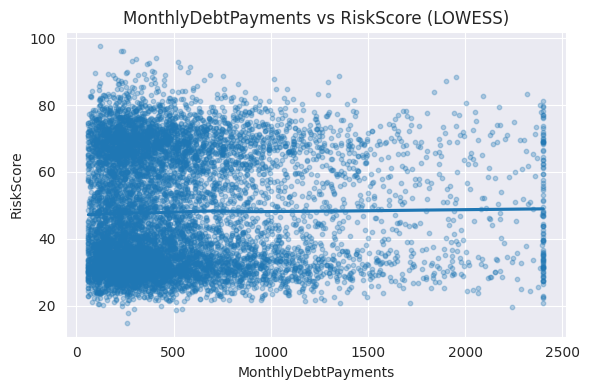

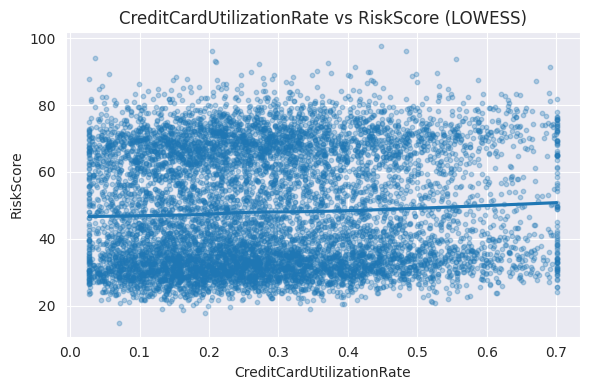

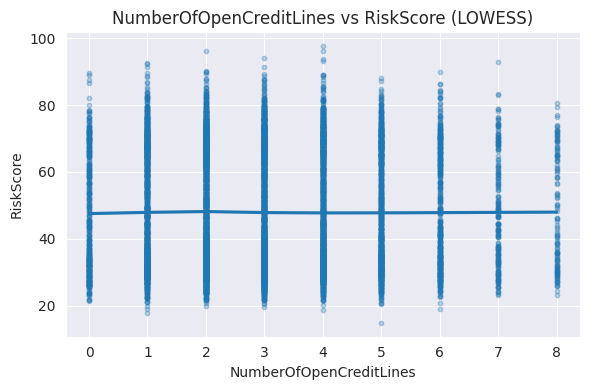

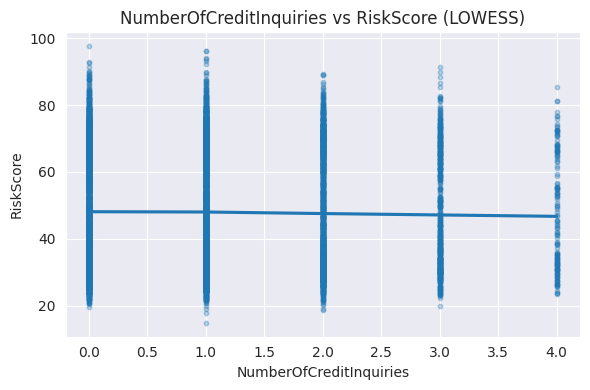

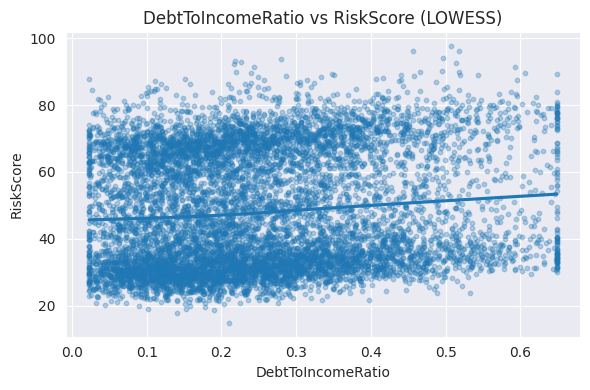

⏭Пропускаем BankruptcyHistory (уникальных значений: 2)
⏭Пропускаем PreviousLoanDefaults (уникальных значений: 2)


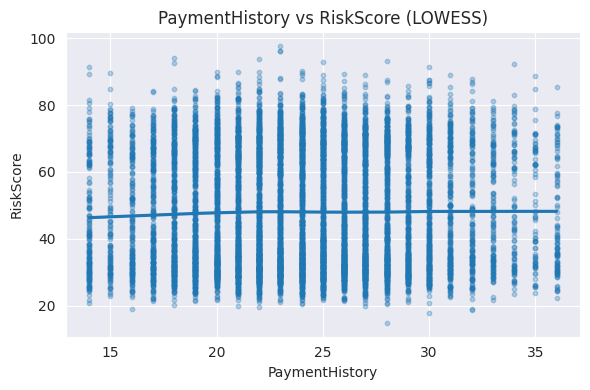

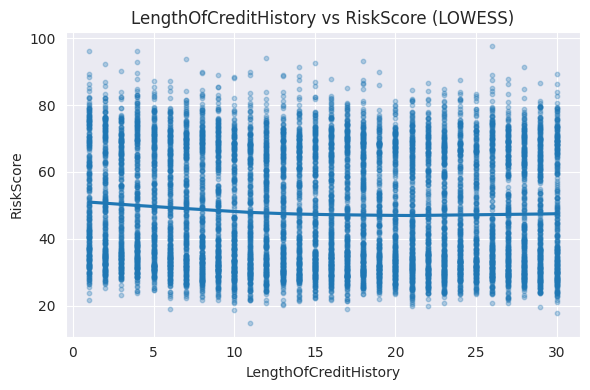

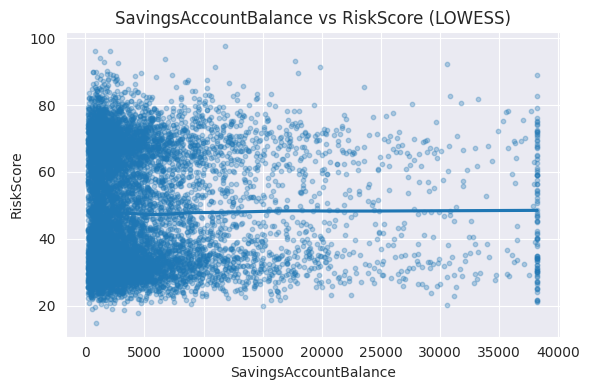

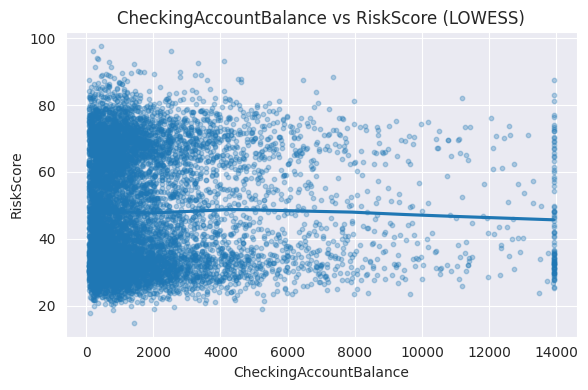

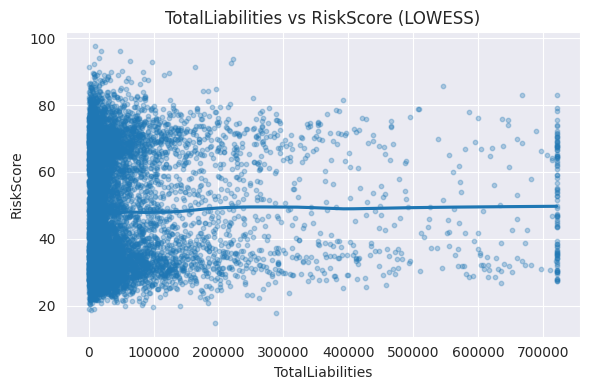

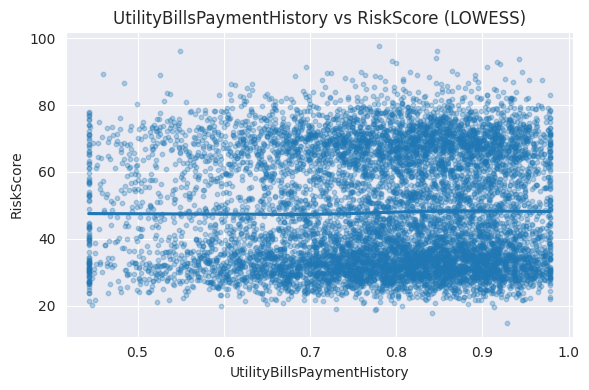

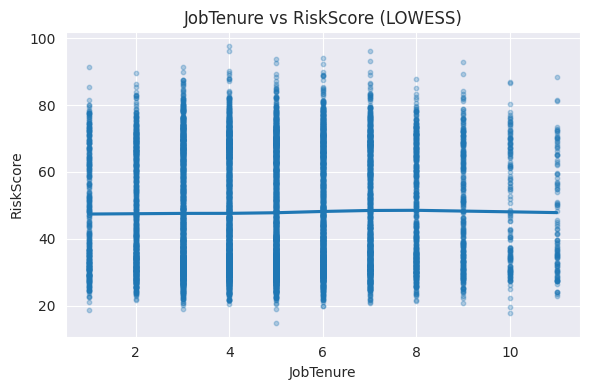

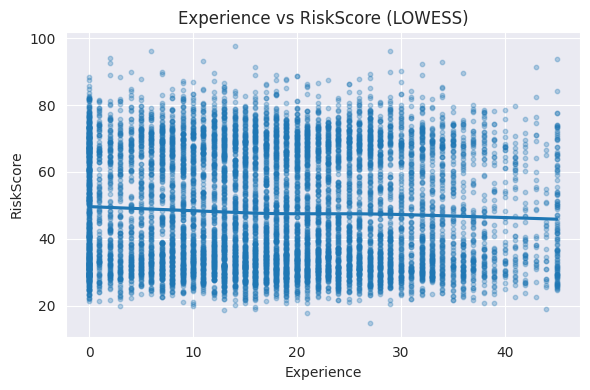

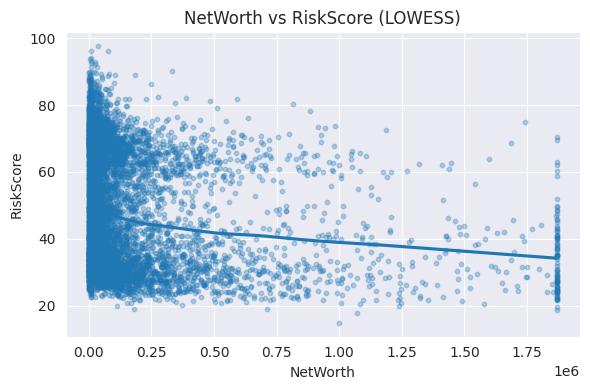

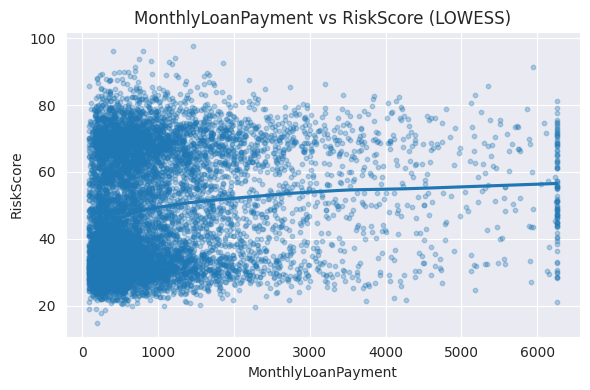

⏭Пропускаем LoanApproved (уникальных значений: 2)


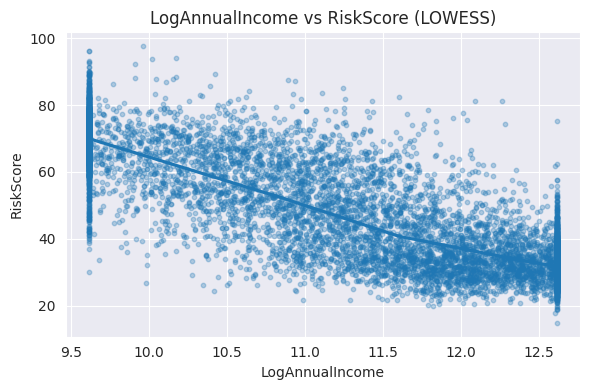

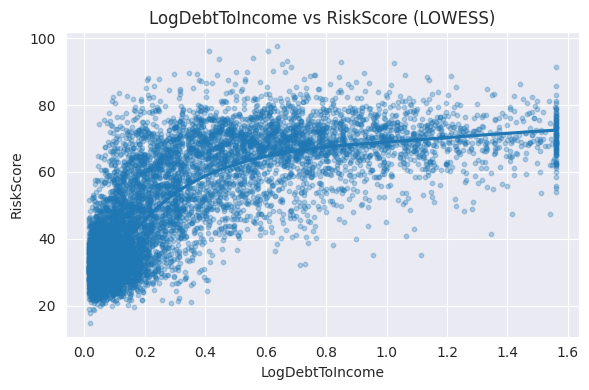

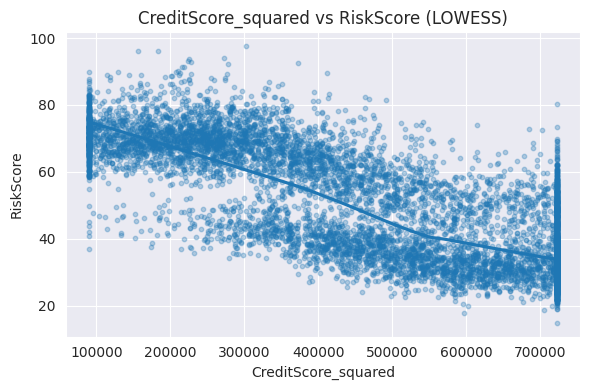

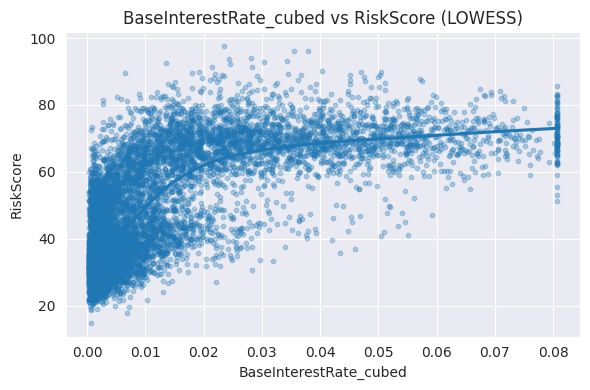

In [15]:
import seaborn as sns
import matplotlib.pyplot as plt

num_cols = df_train.select_dtypes(include='number').columns.drop("RiskScore", errors="ignore")

for col in num_cols:
    tmp = df_train[[col, "RiskScore"]].dropna()
    if tmp[col].nunique() < 5:
        print(f"⏭Пропускаем {col} (уникальных значений: {tmp[col].nunique()})")
        continue
    if not np.isfinite(tmp[col]).all():
        print(f" Признак {col} содержит ±inf — пропущен")
        continue

    plt.figure(figsize=(6, 4))
    sns.regplot(x=col, y="RiskScore", data=tmp, lowess=True,
                scatter_kws={'s': 10, 'alpha': 0.3})
    plt.title(f"{col} vs RiskScore (LOWESS)")
    plt.tight_layout()
    plt.show()



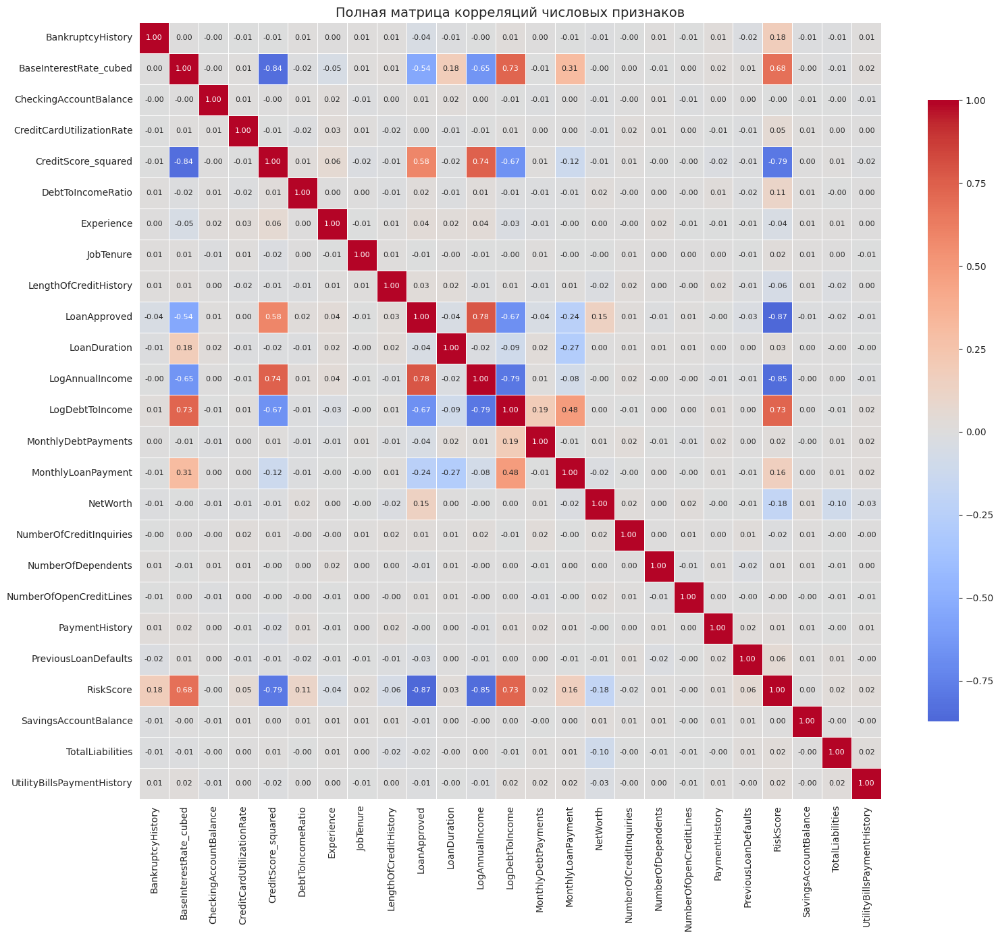

In [16]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

num_cols = df_train.select_dtypes(include="number").columns.drop("RiskScore")
corr = df_train[num_cols.union(["RiskScore"])].corr()

plt.figure(figsize=(16,14))
sns.heatmap(
    corr,
    annot=True,
    fmt=".2f",
    cmap="coolwarm",
    center=0,
    linewidths=0.5,
    cbar_kws={"shrink": .8},
    annot_kws={"size": 8}
)
plt.xticks(rotation=90, fontsize=10)
plt.yticks(rotation=0, fontsize=10)
plt.title("Полная матрица корреляций числовых признаков", fontsize=14)
plt.tight_layout()
plt.show()


#### Отберем числовые признаки

In [17]:
exclude = ["RiskScore", "RiskClass", "ApplicationDate"]
num_cols = df_train.select_dtypes(include="number").columns
X_cols = [col for col in num_cols if col not in exclude]


##### Нормализуем числовые признаки

In [18]:
from normalization import normalize_zscore

df_train[X_cols], stats = normalize_zscore(df_train[X_cols])
df_test[X_cols], _ = normalize_zscore(df_test[X_cols], ref_stats=stats)


#### Добавим категориальные признаки

In [19]:
cat_cols = df_train.select_dtypes(include="object").columns.tolist()
print("Категориальные признаки:")
for col in cat_cols:
    print(f"{col}: {df_train[col].nunique()} уникальных")


Категориальные признаки:
ApplicationDate: 9332 уникальных
MaritalStatus: 4 уникальных
HomeOwnershipStatus: 4 уникальных
LoanPurpose: 5 уникальных
EmploymentStatus: 3 уникальных
EducationLevel: 5 уникальных


###### Удалим ApplicationDate

In [20]:
df_train = df_train.drop(columns=["ApplicationDate"])
df_test = df_test.drop(columns=["ApplicationDate"])

In [21]:
df_train["__is_train__"] = 1
df_test["__is_train__"] = 0
df_full = pd.concat([df_train, df_test], axis=0)

edu_order = {
    "None": 0,
    "Primary": 1,
    "Secondary": 2,
    "Bachelor": 3,
    "Master": 4
}
df_full["EducationLevel"] = df_full["EducationLevel"].map(edu_order)

one_hot_cols = ["MaritalStatus", "HomeOwnershipStatus", "LoanPurpose", "EmploymentStatus"]
df_full = pd.get_dummies(df_full, columns=one_hot_cols, drop_first=True)

df_train = df_full[df_full["__is_train__"] == 1].drop(columns="__is_train__")
df_test = df_full[df_full["__is_train__"] == 0].drop(columns="__is_train__")


In [22]:
bool_cols = df_train.select_dtypes(include='bool').columns.tolist()
print("Колонки типа bool:", bool_cols)


Колонки типа bool: ['MaritalStatus_Married', 'MaritalStatus_Single', 'MaritalStatus_Widowed', 'HomeOwnershipStatus_Other', 'HomeOwnershipStatus_Own', 'HomeOwnershipStatus_Rent', 'LoanPurpose_Debt Consolidation', 'LoanPurpose_Education', 'LoanPurpose_Home', 'LoanPurpose_Other', 'EmploymentStatus_Self-Employed', 'EmploymentStatus_Unemployed']


In [23]:
df_train[bool_cols] = df_train[bool_cols].astype(float)
df_test[bool_cols] = df_test[bool_cols].astype(float)

In [24]:
numeric_df = df_train.select_dtypes(include=["number"])  # только числовые признаки
corr = numeric_df.corr().abs()
np.fill_diagonal(corr.values, 0)

high_corr_pairs = corr[corr > 0.9999].stack()
print("Сильно зависимые признаки:")
print(high_corr_pairs)


Сильно зависимые признаки:
Series([], dtype: float64)


In [25]:
df_train = df_train.drop(columns=["ID"])

df_train["EducationLevel"] = df_train["EducationLevel"].fillna(-1)
df_test["EducationLevel"] = df_test["EducationLevel"].fillna(-1)

#### Финальный список признаков

In [26]:
from numpy import isnan, isinf

X_low_df = df_train[df_train["RiskClass"] == "low"][X_cols]

print("NaN:", X_low_df.isna().sum().sum())
print("inf:", np.isinf(X_low_df.to_numpy()).sum())

print("std == 0:")
print(X_low_df.std()[X_low_df.std() < 1e-6])


NaN: 0
inf: 0
std == 0:
Series([], dtype: float64)


In [27]:
exclude = ["RiskScore", "RiskClass"]
X_cols = [col for col in df_train.columns if col not in exclude]

df_low = df_train[df_train["RiskClass"] == "low"]
df_high = df_train[df_train["RiskClass"] == "high"]

In [28]:
X_low = df_low[X_cols].to_numpy()
y_low = df_low["RiskScore"].to_numpy()

X_high = df_high[X_cols].to_numpy()
y_high = df_high["RiskScore"].to_numpy()

X_test = df_test[X_cols].to_numpy()

In [29]:
X_low_df = df_train[df_train["RiskClass"] == "low"][X_cols]
print(X_low_df.isna().sum()[X_low_df.isna().any()])


Series([], dtype: int64)


# EDA готова

### Линейная регрессия

In [30]:
from linear_regression import LinearRegressionManual
from sklearn.linear_model import LinearRegression

# LOW
X_low = df_train[df_train["RiskClass"] == "low"][X_cols].to_numpy()
y_low = df_train[df_train["RiskClass"] == "low"]["RiskScore"].to_numpy()

# HIGH
X_high = df_train[df_train["RiskClass"] == "high"][X_cols].to_numpy()
y_high = df_train[df_train["RiskClass"] == "high"]["RiskScore"].to_numpy()


In [31]:
# 1. Analytic
model_analytic = LinearRegressionManual(method="analytic")
model_analytic.fit(X_low, y_low)
pred_analytic = model_analytic.predict(X_low)

# 2. Gradient
model_gradient = LinearRegressionManual(method="gradient", alpha=0.01, n_iters=1000)
model_gradient.fit(X_low, y_low)
pred_gradient = model_gradient.predict(X_low)

# 3. SGD
model_sgd = LinearRegressionManual(method="sgd", alpha=0.01, n_iters=1000)
model_sgd.fit(X_low, y_low)
pred_sgd = model_sgd.predict(X_low)

# 4. Sklearn
model_sklearn = LinearRegression()
model_sklearn.fit(X_low, y_low)
pred_sklearn = model_sklearn.predict(X_low)


In [32]:
from metrics import mean_squared_error_manual, mean_absolute_error_manual, r2_score_manual

models = {
    "Analytic": pred_analytic,
    "Gradient": pred_gradient,
    "SGD": pred_sgd,
    "Sklearn": pred_sklearn
}

for name, preds in models.items():
    mse = mean_squared_error_manual(y_low, preds)
    mae = mean_absolute_error_manual(y_low, preds)
    r2 = r2_score_manual(y_low, preds)
    print(f"{name}: MSE={mse:.4f}, MAE={mae:.4f}, R²={r2:.4f}")


Analytic: MSE=10.0672, MAE=2.5147, R²=0.7764
Gradient: MSE=17.8489, MAE=3.3504, R²=0.6036
SGD: MSE=14.0805, MAE=2.9724, R²=0.6873
Sklearn: MSE=10.0672, MAE=2.5147, R²=0.7764


In [33]:
model_analytic_high = LinearRegressionManual(method="analytic")
model_analytic_high.fit(X_high, y_high)
pred_analytic_high = model_analytic_high.predict(X_high)

model_gradient_high = LinearRegressionManual(method="gradient", alpha=0.01, n_iters=1000)
model_gradient_high.fit(X_high, y_high)
pred_gradient_high = model_gradient_high.predict(X_high)

model_sgd_high = LinearRegressionManual(method="sgd", alpha=0.01, n_iters=1000)
model_sgd_high.fit(X_high, y_high)
pred_sgd_high = model_sgd_high.predict(X_high)

model_sklearn_high = LinearRegression()
model_sklearn_high.fit(X_high, y_high)
pred_sklearn_high = model_sklearn_high.predict(X_high)


In [34]:
from metrics import mean_squared_error_manual, mean_absolute_error_manual, r2_score_manual

models_high = {
    "Analytic": pred_analytic_high,
    "Gradient": pred_gradient_high,
    "SGD": pred_sgd_high,
    "Sklearn": pred_sklearn_high
}

for name, preds in models_high.items():
    mse = mean_squared_error_manual(y_high, preds)
    mae = mean_absolute_error_manual(y_high, preds)
    r2 = r2_score_manual(y_high, preds)
    print(f"[HIGH] {name}: MSE={mse:.4f}, MAE={mae:.4f}, R²={r2:.4f}")


[HIGH] Analytic: MSE=13.0578, MAE=2.8591, R²=0.8120
[HIGH] Gradient: MSE=22.6301, MAE=3.4921, R²=0.6741
[HIGH] SGD: MSE=19.9489, MAE=3.4802, R²=0.7128
[HIGH] Sklearn: MSE=13.0578, MAE=2.8591, R²=0.8120


### K_FOLD, LOO

In [35]:
from cross_validation import kfold_split, cross_val_score_manual
from metrics import mean_squared_error_manual
from linear_regression import LinearRegressionManual
import numpy as np

cv_kfold = kfold_split(X_low, n_splits=10, shuffle=True, random_state=42)

model = LinearRegressionManual(method="analytic", alpha=0.01, n_iters=1000)
scores_kfold = cross_val_score_manual(model, X_low, y_low, cv=cv_kfold, scoring=mean_squared_error_manual)

print("k-fold MSE (LOW):", np.mean(scores_kfold))


k-fold MSE (LOW): 10.218679321101146


In [36]:
cv_kfold = kfold_split(X_high, n_splits=5, shuffle=True, random_state=42)

model = LinearRegressionManual(method="analytic", alpha=0.01, n_iters=1000)
scores_kfold = cross_val_score_manual(model, X_high, y_high, cv=cv_kfold, scoring=mean_squared_error_manual)

print("k-fold MSE (HIGH):", np.mean(scores_kfold))


k-fold MSE (HIGH): 13.371150806928526


In [37]:
#from cross_validation import loo_split

#cv_loo = loo_split(X_high)

#model_factory = lambda: LinearRegressionManual(method="gradient", alpha=0.01, n_iters=1000)

#scores_loo = cross_val_score_manual(model_factory, X_high, y_high, cv=cv_loo, #scoring=mean_squared_error_manual)

#print("LOO MSE (HIGH):", np.mean(scores_loo))


## Регуляризация

In [38]:
from regularization import ridge_regression, lasso_regression, elastic_net_regression
from metrics import mean_squared_error_manual, mean_absolute_error_manual, r2_score_manual
from hyperparameter_tuning import grid_search_cv
from cross_validation import kfold_split
from normalization import normalize_zscore
import numpy as np

class RidgeWrapper:
    def __init__(self, alpha):
        self.alpha = alpha

    def fit(self, X, y):
        X_b = np.c_[np.ones(len(X)), X]
        self.w_hist, _ = ridge_regression(X_b, y, alpha=self.alpha, alpha_lr=0.001, n_iters=1000)
        self.w = self.w_hist[-1]

    def predict(self, X):
        X_b = np.c_[np.ones(len(X)), X]
        return X_b @ self.w



class LassoWrapper:
    def __init__(self, alpha):
        self.alpha = alpha

    def fit(self, X, y):
        X_b = np.c_[np.ones(len(X)), X]
        self.w_hist, _ = lasso_regression(X_b, y, alpha=self.alpha, alpha_lr=0.001, n_iters=1000)
        self.w = self.w_hist[-1]

    def predict(self, X):
        X_b = np.c_[np.ones(len(X)), X]
        return X_b @ self.w



class ElasticNetWrapper:
    def __init__(self, alpha1, alpha2):
        self.alpha1 = alpha1
        self.alpha2 = alpha2

    def fit(self, X, y):
        X_b = np.c_[np.ones(len(X)), X]
        self.w_hist, _ = elastic_net_regression(
            X_b, y,
            alpha1=self.alpha1,
            alpha2=self.alpha2,
            alpha_lr=0.001,
            n_iters=1000
        )
        self.w = self.w_hist[-1]

    def predict(self, X):
        X_b = np.c_[np.ones(len(X)), X]
        return X_b @ self.w


def run_regularization_block(X_raw, y, label="LOW"):
    X_norm = X_raw

    cv = kfold_split(X_norm, n_splits=5, shuffle=True, random_state=42)

    grid_ridge = {"alpha": [1e-5, 1e-4, 1e-3, 1e-2]}
    grid_lasso = {"alpha": [1e-5, 1e-4, 1e-3, 1e-2, 0.1]}
    grid_elastic = {
        "alpha1": [1e-4, 1e-3, 1e-2],
        "alpha2": [1e-4, 1e-3, 1e-2]
    }

    print(f"\n🔍 Ridge ({label}):")
    best_ridge, score_ridge, _ = grid_search_cv(RidgeWrapper, grid_ridge, X_norm, y, cv=cv,
                                                scoring=mean_squared_error_manual, verbose=False)

    print(f"\n🔍 Lasso ({label}):")
    best_lasso, score_lasso, _ = grid_search_cv(LassoWrapper, grid_lasso, X_norm, y, cv=cv,
                                                scoring=mean_squared_error_manual, verbose=False)

    print(f"\n🔍 ElasticNet ({label}):")
    best_elastic, score_elastic, _ = grid_search_cv(ElasticNetWrapper, grid_elastic, X_norm, y, cv=cv,
                                                    scoring=mean_squared_error_manual, verbose=False)

    def report(name, model_class, params):
        model = model_class(**params)
        model.fit(X_norm, y)
        y_pred = model.predict(X_norm)
        print(f"\n📊 {label} — {name}")
        print("Best params:", params)
        print("MSE  =", mean_squared_error_manual(y, y_pred))
        print("MAE  =", mean_absolute_error_manual(y, y_pred))
        print("R²   =", r2_score_manual(y, y_pred))
        print("mean |w|:", np.mean(np.abs(model.w)))
        print("non-zero weights:", np.count_nonzero(np.abs(model.w) > 1e-4))

    report("Ridge", RidgeWrapper, best_ridge)
    report("Lasso", LassoWrapper, best_lasso)
    report("ElasticNet", ElasticNetWrapper, best_elastic)

run_regularization_block(X_low, y_low, label="LOW")
run_regularization_block(X_high, y_high, label="HIGH")



🔍 Ridge (LOW):

🔍 Lasso (LOW):

🔍 ElasticNet (LOW):

📊 LOW — Ridge
Best params: {'alpha': 1e-05}
MSE  = 115.4588736076318
MAE  = 8.10828950570891
R²   = -1.5642844138803431
mean |w|: 1.7099153147594062
non-zero weights: 38

📊 LOW — Lasso
Best params: {'alpha': 1e-05}
MSE  = 115.45797274458742
MAE  = 8.108270440975744
R²   = -1.5642644061581854
mean |w|: 1.70991796946621
non-zero weights: 38

📊 LOW — ElasticNet
Best params: {'alpha1': 0.0001, 'alpha2': 0.0001}
MSE  = 115.46782229837329
MAE  = 8.10846562427429
R²   = -1.5644831598708069
mean |w|: 1.7098193592252866
non-zero weights: 38

🔍 Ridge (HIGH):

🔍 Lasso (HIGH):

🔍 ElasticNet (HIGH):

📊 HIGH — Ridge
Best params: {'alpha': 1e-05}
MSE  = 57.107949057738956
MAE  = 5.687491004548545
R²   = 0.17769434116280525
mean |w|: 3.0528416383974757
non-zero weights: 38

📊 HIGH — Lasso
Best params: {'alpha': 0.01}
MSE  = 57.11352722626103
MAE  = 5.687193702961358
R²   = 0.17761402030349693
mean |w|: 3.048674728959739
non-zero weights: 38

📊 HIGH

## Ансамбли

In [39]:
from ensemble_manual import (
    BaggingRegressorManual,
    RandomForestRegressorManual,
    AdaBoostRegressorManual,
    GradientBoostingRegressorManual
)
from linear_regression import LinearRegressionManual
from cross_validation import kfold_split
from hyperparameter_tuning import grid_search_cv
from metrics import mean_squared_error_manual
import numpy as np

def make_bagging(n_estimators, max_samples):
    return BaggingRegressorManual(
        base_estimator=LinearRegressionManual(method="analytic"),
        n_estimators=n_estimators,
        max_samples=max_samples,
        random_state=42
    )

def make_rf(n_estimators, max_samples, max_features):
    return RandomForestRegressorManual(
        base_estimator=LinearRegressionManual(method="analytic"),
        n_estimators=n_estimators,
        max_samples=max_samples,
        max_features=max_features,
        random_state=42
    )

def make_ada(n_estimators, learning_rate):
    return AdaBoostRegressorManual(
        base_estimator=LinearRegressionManual(method="analytic"),
        n_estimators=n_estimators,
        learning_rate=learning_rate
    )

def make_gbm(n_estimators, learning_rate):
    return GradientBoostingRegressorManual(
        base_estimator=LinearRegressionManual(method="analytic"),
        n_estimators=n_estimators,
        learning_rate=learning_rate
    )


In [40]:
def run_ensembles(X, y, label="LOW"):
    cv = kfold_split(X, n_splits=5, shuffle=True, random_state=42)

    grid_bag = {
        "n_estimators": [10, 50],
        "max_samples": [0.5, 1.0]
    }

    grid_rf = {
        "n_estimators": [10, 50],
        "max_samples": [0.5, 1.0],
        "max_features": ["sqrt", 0.5]
    }

    grid_ada = {
        "n_estimators": [10, 50],
        "learning_rate": [0.05, 0.1, 0.5]
    }

    grid_gbm = {
        "n_estimators": [10, 50],
        "learning_rate": [0.05, 0.1, 0.5]
    }

    results = {}

    print(f"\n🔁 Bagging ({label}):")
    best_bag, score_bag, _ = grid_search_cv(make_bagging, grid_bag, X, y, cv=cv,
                                            scoring=mean_squared_error_manual, verbose=False)
    results["Bagging"] = (best_bag, score_bag)

    print(f"\n🌲 Random Forest ({label}):")
    best_rf, score_rf, _ = grid_search_cv(make_rf, grid_rf, X, y, cv=cv,
                                          scoring=mean_squared_error_manual, verbose=False)
    results["Random Forest"] = (best_rf, score_rf)

    print(f"\n⚡ AdaBoost ({label}):")
    best_ada, score_ada, _ = grid_search_cv(make_ada, grid_ada, X, y, cv=cv,
                                            scoring=mean_squared_error_manual, verbose=False)
    results["AdaBoost"] = (best_ada, score_ada)

    print(f"\n📈 Gradient Boosting ({label}):")
    best_gbm, score_gbm, _ = grid_search_cv(make_gbm, grid_gbm, X, y, cv=cv,
                                            scoring=mean_squared_error_manual, verbose=False)
    results["GradientBoosting"] = (best_gbm, score_gbm)

    print(f"\n📊 Сравнение ансамблей ({label}):")
    for name, (params, score) in results.items():
        print(f"{name:20s} — MSE: {score:.4f}, params: {params}")

    best_model_name = min(results.items(), key=lambda x: x[1][1])[0]
    print(f"\n✅ ЛУЧШИЙ АНСАМБЛЬ ({label}): {best_model_name} с MSE = {results[best_model_name][1]:.4f}")


In [41]:
run_ensembles(X_low, y_low, label="LOW")
run_ensembles(X_high, y_high, label="HIGH")



🔁 Bagging (LOW):

🌲 Random Forest (LOW):

⚡ AdaBoost (LOW):

📈 Gradient Boosting (LOW):

📊 Сравнение ансамблей (LOW):
Bagging              — MSE: 10.2502, params: {'n_estimators': 10, 'max_samples': 1.0}
Random Forest        — MSE: 16.1702, params: {'n_estimators': 50, 'max_samples': 0.5, 'max_features': 0.5}
AdaBoost             — MSE: 10.2458, params: {'n_estimators': 50, 'learning_rate': 0.5}
GradientBoosting     — MSE: 10.2455, params: {'n_estimators': 50, 'learning_rate': 0.1}

✅ ЛУЧШИЙ АНСАМБЛЬ (LOW): GradientBoosting с MSE = 10.2455

🔁 Bagging (HIGH):

🌲 Random Forest (HIGH):

⚡ AdaBoost (HIGH):

📈 Gradient Boosting (HIGH):

📊 Сравнение ансамблей (HIGH):
Bagging              — MSE: 13.3708, params: {'n_estimators': 50, 'max_samples': 0.5}
Random Forest        — MSE: 23.6955, params: {'n_estimators': 50, 'max_samples': 1.0, 'max_features': 0.5}
AdaBoost             — MSE: 13.3712, params: {'n_estimators': 50, 'learning_rate': 0.5}
GradientBoosting     — MSE: 13.3707, params: {'n

## Сабмит

In [42]:
X_train_all = df_train[X_cols].to_numpy()
y_train_all = df_train["RiskScore"].to_numpy()
X_test = df_test[X_cols].to_numpy()

from linear_regression import LinearRegressionManual
from ensemble_manual import GradientBoostingRegressorManual

model = GradientBoostingRegressorManual(
    base_estimator=LinearRegressionManual(method="analytic"),
    n_estimators=50,
    learning_rate=0.1
)

model.fit(X_train_all, y_train_all)


In [43]:
y_pred_test = model.predict(X_test)
df_test["RiskScore"] = y_pred_test


In [44]:
submission = df_test[["ID", "RiskScore"]].copy()
submission.to_csv("submission.csv", index=False)
print("submission.csv сохранён")


submission.csv сохранён
